<a href="https://colab.research.google.com/github/jesus-tomas-girones/Mask_Detect/blob/main/6cat_val_VGG16.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
FOLDER = '6cat_val'
!wget "http://mmoviles.upv.es/mascarillas/{FOLDER}.zip"
!unzip -qq -n {FOLDER}.zip


--2021-06-17 16:00:57--  http://mmoviles.upv.es/mascarillas/6cat_val.zip
Resolving mmoviles.upv.es (mmoviles.upv.es)... 158.42.250.56
Connecting to mmoviles.upv.es (mmoviles.upv.es)|158.42.250.56|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 31735949 (30M) [application/zip]
Saving to: ‘6cat_val.zip.3’

6cat_val.zip.3      100%[===================>]  30.27M  9.60MB/s    in 3.2s    

2021-06-17 16:01:00 (9.60 MB/s) - ‘6cat_val.zip.3’ saved [31735949/31735949]



In [ ]:
from keras_preprocessing.image import ImageDataGenerator

BATCH_SIZE = 32
IMG_SIZE = (224, 224)

training_datagen = ImageDataGenerator(
      rescale = 1./255,
      rotation_range=5,
      horizontal_flip=True)
train_generator = training_datagen.flow_from_directory(
	   FOLDER+'/training',
     batch_size=BATCH_SIZE,
     seed=9,
	   target_size=IMG_SIZE)
validation_datagen = ImageDataGenerator(
      rescale = 1./255)
validation_generator = validation_datagen.flow_from_directory(
	  FOLDER+'/validation/',
    batch_size=BATCH_SIZE,
	  target_size=IMG_SIZE,
    shuffle=False,
    seed=9) 

Found 1000 images belonging to 6 classes.
Found 194 images belonging to 6 classes.


In [ ]:
from tensorflow import keras

base_model = keras.applications.VGG16(
    weights="imagenet",  # Load weights pre-trained on ImageNet.
    input_shape=IMG_SIZE+(3,),
    include_top=False, # Do not include the ImageNet classifier at the top.
)  
base_model.trainable = False # Freeze the base_model

inputs = keras.Input(shape=IMG_SIZE+(3,))
x = inputs
x = base_model(x, training=False)
#x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Flatten()(x)
x = keras.layers.Dense(512)(x)
x = keras.layers.Dropout(0.2)(x)  # Regularize with dropout
outputs = keras.layers.Dense(6, activation="softmax")(x)
model = keras.Model(inputs, outputs)

model.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_14 (InputLayer)        [(None, 331, 331, 3)]     0         
_________________________________________________________________
vgg16 (Functional)           (None, 10, 10, 512)       14714688  
_________________________________________________________________
flatten_3 (Flatten)          (None, 51200)             0         
_________________________________________________________________
dense_10 (Dense)             (None, 512)               26214912  
_________________________________________________________________
dropout_5 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_11 (Dense)             (None, 6)                 3078      
Total params: 40,932,678
Trainable params: 26,217,990
Non-trainable params: 14,714,688
______________________________________

## Train the top layer

In [ ]:
EPOCHS = 20
INIT_LR = 1e-4
model.compile(
    optimizer=keras.optimizers.Adam(
        learning_rate=INIT_LR, 
        decay=INIT_LR / EPOCHS
        ),
    loss=keras.losses.categorical_crossentropy,
    metrics=["accuracy"],
)
H = model.fit(
    train_generator, 
    epochs=EPOCHS, 
    batch_size = BATCH_SIZE,
    validation_data=validation_generator,
    validation_batch_size = BATCH_SIZE,
)

Epoch 1/20
32/32 [==============================] - 28s 703ms/step - loss: 3.8051 - accuracy: 0.4570 - val_loss: 1.4877 - val_accuracy: 0.6031
Epoch 2/20
32/32 [==============================] - 21s 659ms/step - loss: 0.8954 - accuracy: 0.7550 - val_loss: 0.8546 - val_accuracy: 0.7474
Epoch 3/20
32/32 [==============================] - 21s 672ms/step - loss: 0.4420 - accuracy: 0.8420 - val_loss: 0.7400 - val_accuracy: 0.7577
Epoch 4/20
32/32 [==============================] - 21s 651ms/step - loss: 0.3906 - accuracy: 0.8630 - val_loss: 0.6775 - val_accuracy: 0.7474
Epoch 5/20
32/32 [==============================] - 21s 655ms/step - loss: 0.2498 - accuracy: 0.9030 - val_loss: 0.7187 - val_accuracy: 0.7577
Epoch 6/20
32/32 [==============================] - 21s 660ms/step - loss: 0.1953 - accuracy: 0.9350 - val_loss: 0.6323 - val_accuracy: 0.7887
Epoch 7/20
32/32 [==============================] - 21s 654ms/step - loss: 0.1724 - accuracy: 0.9460 - val_loss: 0.8038 - val_accuracy: 0.7577

## Fine-tuning of the entire model

In [ ]:
base_model.trainable = True

EPOCHS = 20
INIT_LR = 1e-4
model.compile(
    optimizer=keras.optimizers.Adam(
        learning_rate=INIT_LR, 
        decay=INIT_LR / EPOCHS),
    loss=keras.losses.categorical_crossentropy,
    metrics=["accuracy"],
)
H2 = model.fit(
    train_generator, 
    epochs=EPOCHS, 
    batch_size = BATCH_SIZE,
    validation_data=validation_generator,
    validation_batch_size = BATCH_SIZE,
)

#Concatenamos historia de entrenamiento
H.history['loss'] = H.history['loss'] + H2.history['loss']
H.history['accuracy'] = H.history['accuracy'] + H2.history['accuracy']
H.history['val_loss'] = H.history['val_loss'] + H2.history['val_loss']
H.history['val_accuracy'] = H.history['val_accuracy'] + H2.history['val_accuracy']

Epoch 1/20
32/32 [==============================] - 28s 783ms/step - loss: 2.0887 - accuracy: 0.5640 - val_loss: 1.0070 - val_accuracy: 0.6907
Epoch 2/20
32/32 [==============================] - 25s 781ms/step - loss: 0.9332 - accuracy: 0.7140 - val_loss: 0.8592 - val_accuracy: 0.7113
Epoch 3/20
32/32 [==============================] - 25s 779ms/step - loss: 0.8365 - accuracy: 0.7390 - val_loss: 0.9110 - val_accuracy: 0.7062
Epoch 4/20
32/32 [==============================] - 25s 778ms/step - loss: 0.7637 - accuracy: 0.7460 - val_loss: 0.7125 - val_accuracy: 0.7732
Epoch 5/20
32/32 [==============================] - 25s 784ms/step - loss: 0.6509 - accuracy: 0.7780 - val_loss: 0.6077 - val_accuracy: 0.7887
Epoch 6/20
32/32 [==============================] - 25s 787ms/step - loss: 0.5827 - accuracy: 0.7910 - val_loss: 0.6454 - val_accuracy: 0.7990
Epoch 7/20
32/32 [==============================] - 25s 787ms/step - loss: 0.4885 - accuracy: 0.8150 - val_loss: 0.4497 - val_accuracy: 0.8454

acc:  [0.4569999873638153, 0.7549999952316284, 0.8420000076293945, 0.8629999756813049, 0.902999997138977, 0.9350000023841858, 0.9459999799728394, 0.9509999752044678, 0.9629999995231628, 0.984000027179718, 0.9850000143051147, 0.984000027179718, 0.972000002861023, 0.8999999761581421, 0.949999988079071, 0.9800000190734863, 0.9900000095367432, 0.9919999837875366, 0.9929999709129333, 0.996999979019165, 0.5640000104904175, 0.7139999866485596, 0.7390000224113464, 0.7459999918937683, 0.777999997138977, 0.7910000085830688, 0.8149999976158142, 0.8420000076293945, 0.8410000205039978, 0.8849999904632568, 0.8960000276565552, 0.8840000033378601, 0.9330000281333923, 0.9290000200271606, 0.953000009059906, 0.9369999766349792, 0.9390000104904175, 0.9679999947547913, 0.9769999980926514, 0.9229999780654907]
val_acc:  [0.6030927896499634, 0.7474226951599121, 0.7577319741249084, 0.7474226951599121, 0.7577319741249084, 0.7886598110198975, 0.7577319741249084, 0.7835051417350769, 0.7938144207000732, 0.79896908

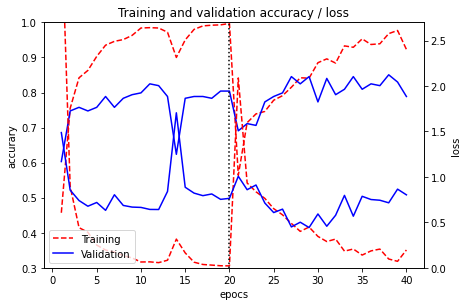

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

import matplotlib.pyplot as plt

def show_accuracy(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs = range(1, len(acc)+1)
  print("acc: ", acc)
  print("val_acc: ", val_acc)
  print("loss: ", loss)
  print("val_loss: ", val_loss)
  
  fig, ax1 = plt.subplots()
  fig.tight_layout()  # otherwise the right y-label is slightly clipped
  ax1.axis(ymin=0.3, ymax=1.0)
  ax1.set_xlabel('epocs')
  ax1.set_ylabel('accurary')
  ax1.plot(epochs, acc, 'r--', label='Training accuracy')
  ax1.plot(epochs, val_acc, 'b', label='Validation accuracy')
  ax2 = ax1.twinx() 
  ax2.set_ylabel('loss')
  ax2.axis(ymin=0.0, ymax=2.7)
  ax2.plot(epochs, loss, 'r--', label='Training')
  ax2.plot(epochs, val_loss, 'b', label='Validation')
  plt.title('Training and validation accuracy / loss')
  plt.legend(loc="lower left")#"best")#0
  plt.axvline(x=20, color='k', linestyle='dotted')
  plt.show()

show_accuracy(H)

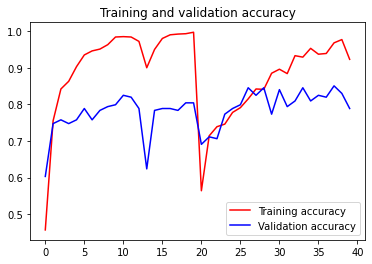

<Figure size 432x288 with 0 Axes>

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

import matplotlib.pyplot as plt

def show_accuracy(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  #loss = history.history['loss']
  #val_loss = history.history['val_loss']
  epochs = range(len(acc))
  plt.plot(epochs, acc, 'r', label='Training accuracy')
  plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
  plt.title('Training and validation accuracy')
  plt.legend(loc=0)
  plt.figure()
  plt.show()

show_accuracy(H)

              precision    recall  f1-score   support

     GLASSES       0.26      0.67      0.38         9
    SIDE FIT       0.73      0.73      0.73        11
    NOSE OUT       0.92      0.82      0.87        28
          OK       0.89      0.80      0.84        89
    N.BRIDGE       0.69      0.69      0.69        32
     WITHOUT       1.00      0.92      0.96        25

    accuracy                           0.79       194
   macro avg       0.75      0.77      0.74       194
weighted avg       0.84      0.79      0.81       194



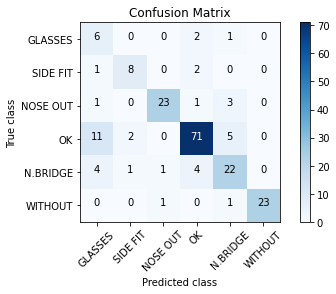

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

from collections import Counter
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import itertools
import numpy as np

def plot_confusion_matrix(cm, classes_map,
                          normalize=False,
                          title='Confusion Matrix',
                          cmap=plt.cm.Blues):
    """
    Esta función visualiza la matriz de confusión.
    Usa el parámetro `normalize=True` para normalizar los resultados.
    Note, this code is taken straight from the SKLEARN website, an nice way of viewing confusion matrix.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes_map))
    inv_map = {v: k for k, v in classes_map.items()}
    labels = inv_map.values()
    plt.xticks(tick_marks, labels, rotation=45)
    plt.yticks(tick_marks, labels)
    if normalize:
        cm = np.around(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis], 2)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True class')
    plt.xlabel('Predicted class')

"""
Obtener la matriz de confusión de un corpus creado desde un ImageDataGenerator 
es algo más complejo que el último ejemplo estudiado. El problema está en que las 
muestras son extraidas por lotes (bath) y la función 
confusion_matrix(validation_classes, y_pred) espera que sus dos parámetros sean 
vectores. Para resolverlo recorremos todos los lotes el generador y vamos 
concatenando los vectores adecuados.
Otra solución alternativa en:
https://stackoverflow.com/questions/47907061/how-to-get-confusion-matrix-when-using-model-fit-generator
"""
validation_classes = []
validation_images = []
for i in range( -(-validation_generator.samples // validation_generator.batch_size)):  # número de veces que podemos sacar batch redondeado hacia arriba
   batch = validation_generator.next()
   expected = np.argmax(batch[1], axis=1) 
   validation_classes.extend(expected)
   validation_images.extend(batch[0])
validation_classes = np.array(validation_classes)
validation_images = np.array(validation_images)
Y_pred = model.predict(validation_images)
y_pred = np.argmax(Y_pred, axis=1)


print(classification_report(validation_classes, y_pred, 
		target_names = ['GLASSES', 'SIDE FIT', 'NOSE OUT', 'OK', 'N.BRIDGE', 'WITHOUT']))

my_confussion = confusion_matrix(validation_classes, y_pred)
classes = {'GLASSES': 0, 'SIDE FIT': 1, 'NOSE OUT': 2, 'OK': 3, 'N.BRIDGE': 4, 'WITHOUT': 5}
plot_confusion_matrix(my_confussion, classes_map = classes)#validation_generator.class_indices)#, normalize=True)

Found 194 images belonging to 6 classes.


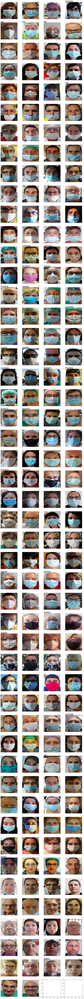

accuracy:  162 / 194  =  0.8350515463917526


In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }
import numpy as np
from keras_preprocessing import image
from keras_preprocessing.image import ImageDataGenerator

NCOLS = 4 # número de columnas

#Visualiza los pimeros <number> imagenes, generadas desde datagen
#se clasifica cada imagen y en caso de error, se muestra la categoría asignada 
def show_generate_images(datagen, sample_number=None):
   if not isinstance(sample_number, (int) ): # Si no se indican cuantas 
      sample_number = datagen.samples        # se visualizan todas
   target_names = []                 # Obtenemos nombres de las clases 
   for key in datagen.class_indices:
      target_names.append(key)  
   nrows = -(-sample_number//NCOLS)  # número de filas (división entera redondeando hacia arriba)
   fig, ax = plt.subplots(nrows=nrows, ncols=NCOLS, figsize=(4*NCOLS,4*nrows))
   errors = 0
   i = 0
   for b in range( -(-sample_number // datagen.batch_size)):  # número de veces que podemos sacar batch redondeado hacia arriba
      x,y = datagen.next()
      for j in range(len(x)):
         if (i < sample_number):
            col = i % NCOLS
            row = i // NCOLS
            ax[row,col].axis('Off')  
            ax[row,col].imshow(x[j])
            y_pred = model.predict(x)[j]  # Verificamos error
            cat = np.argmax(y[j])
            cat_pred = np.argmax(y_pred) 
            if cat != cat_pred :
                ax[row,col].text(0, 0, target_names[cat_pred], fontsize=22)
                errors +=1
            i += 1
   plt.show()
   print("accuracy: ", sample_number-errors,"/",sample_number," = ", (sample_number-errors)/sample_number ) 

validation_generator = validation_datagen.flow_from_directory(
	  FOLDER+"/validation/",
    batch_size=BATCH_SIZE,
	  target_size=(IMG_SIZE),
    shuffle=False)
validation_generator.reset()
show_generate_images(validation_generator)
